<a href="https://colab.research.google.com/github/GLEYSONRN/mastersdegree/blob/main/CPTEn_AutoML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importando bibliotecas e arquivos necessários

In [ ]:
!pip install pycaret==3.0.2

/bin/bash: /home/grnbatera/miniconda3/envs/tf/lib/libtinfo.so.6: no version information available (required by /bin/bash)
  Using cached numpy-1.23.5-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.3 kB)
  Using cached pandas-1.5.3-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)


  Using cached scikit_learn-1.2.2-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)


Using cached numpy-1.23.5-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.1 MB)
Using cached pandas-1.5.3-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (12.2 MB)
Using cached scikit_learn-1.2.2-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (9.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.4
    Uninstalling numpy-1.24.4:
      Successfully uninstalled numpy-1.24.4
  Attempting uninstall: pandas
    Found existing installation: pandas 2.0.3
    Uninstalling pandas-2.0.3:
      Successfully uninstalled pandas-2.0.3
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.3.2
    Uninstalling scikit-learn-1.3.2:
      Successfully uninstalled scikit-learn-1.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.13.1 requires typing-extensions<4.6.0,>=3.6.6, bu

In [ ]:
#!gdown 15DVijHpRZxtyQuwTwqjlmU06LUBnWOFt
#!gdown 1qEliqPLoJ4KSKu6EQ_HYardC_Jn34Vb4
#!7z e CSV_Files.zip
#!rm CSV_Files.zip
#!gdown 1KWp0CA8POz9cEwUREjUO7z5kZDVnNWzM
#!gdown 1lNjkhDM4c5f2ViMcE8wAdOuocL--nHoO

In [ ]:
import random
import gc
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from pycaret.regression import *
from sklearn.model_selection import train_test_split
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
pd.set_option('display.max_columns', None)
seed = 123
np.random.seed(seed)
random.seed(seed)

In [ ]:
sns.set(rc={
    'axes.axisbelow': False,
    'axes.edgecolor': 'lightgrey',
    'axes.facecolor': 'None',
    'axes.grid': False,
    'axes.labelcolor': 'black',
    'axes.spines.right': False,
    'axes.spines.top': False,
    'figure.facecolor': 'w',
    'lines.solid_capstyle': 'round',
    'patch.edgecolor': 'w',
    'patch.force_edgecolor': True,
    'text.color': 'black',
    'xtick.bottom': True,
    'xtick.color': 'black',
    'xtick.direction': 'out',
    'xtick.top': False,
    'ytick.color': 'black',
    'ytick.direction': 'out',
    'ytick.left': True,
    'ytick.right': False})

'''
sns.set_context("notebook", rc={"font.size":20,
                                "axes.titlesize":24,
                                "axes.labelsize":18})
'''

'\nsns.set_context("notebook", rc={"font.size":20,\n                                "axes.titlesize":24,\n                                "axes.labelsize":18})\n'

# Dados Ginásio Multidisciplinar - CPTEn

In [ ]:
df_ginasio = pd.read_csv('ginasio_clima.csv')

In [ ]:
df_ginasio.head()

,Vac1,Vac2,Vac3,Iac1,Iac2,Iac3,Freq,Pac(W),Qac,CosPhi,Vdc1,Idc1,Pdc1,PacGrid,Energy(kWh),ALLSKY_SFC_SW_DWN,ALLSKY_SFC_PAR_TOT,ALLSKY_SFC_UVA,ALLSKY_SFC_UVB,ALLSKY_SFC_UV_INDEX,T2M,T2MDEW,RH2M,PRECTOTCORR,PS,WS10M,WD10M,T2MWET,QV2M,SerialNumber,BoardId,DateTime,GId
0,132.32,132.17,132.41,0.00,0.00,0.00,60.00,0.00,1.57,0.00,580.06,0.00,0.00,0.0,0.00,418.829907,188.831701,24.565894,0.700218,3.635497,24.309817,14.868542,65.829386,0.127613,92.859952,2.833711,205.173799,19.589086,11.787670,380118281416,1DM182813A58,2019-05-04 06:15:00,GINASIO / INVERSOR E
1,132.38,132.21,132.44,1.67,1.59,1.58,60.01,278.89,8.23,-0.02,646.85,0.45,283.97,0.0,0.07,418.149708,188.999570,24.563224,0.700082,3.628132,24.309935,14.868569,64.349319,0.152956,92.890246,2.991591,206.737297,19.589102,11.800590,380118281416,1DM182813A58,2019-05-04 06:30:00,GINASIO / INVERSOR E
2,132.27,132.08,132.24,4.57,4.39,4.56,60.01,1544.97,-0.09,-0.10,739.92,2.14,1587.40,0.0,0.46,413.144859,188.885958,24.711878,0.693977,3.612792,24.309891,14.868609,62.415360,0.175646,92.902015,3.328589,203.934324,19.589131,11.750556,380118281416,1DM182813A58,2019-05-04 06:45:00,GINASIO / INVERSOR E
3,131.93,131.76,131.89,7.90,7.67,7.97,59.99,2977.64,-0.19,0.02,759.57,4.03,3065.23,0.0,1.20,102.020000,44.900000,5.660000,0.030000,0.170000,21.000000,18.290000,84.310000,0.000000,93.220000,2.650000,52.560000,19.650000,14.100000,380118281416,1DM182813A58,2019-05-04 07:00:00,GINASIO / INVERSOR E
4,131.36,131.20,131.33,12.21,11.83,12.24,59.98,4672.84,-0.19,-0.03,770.24,6.24,4812.42,0.0,2.37,409.506854,188.799377,24.844197,0.690942,3.602437,24.309907,14.868629,61.223000,0.171809,92.935683,3.539572,204.551411,19.589140,11.726195,380118281416,1DM182813A58,2019-05-04 07:15:00,GINASIO / INVERSOR E


In [ ]:
subset_E = df_ginasio[(df_ginasio.GId == 'GINASIO / INVERSOR E')
                      & (df_ginasio.Freq >= 59)]
subset_E.columns

Index(['Vac1', 'Vac2', 'Vac3', 'Iac1', 'Iac2', 'Iac3', 'Freq', 'Pac(W)', 'Qac',
       'CosPhi', 'Vdc1', 'Idc1', 'Pdc1', 'PacGrid', 'Energy(kWh)',
       'ALLSKY_SFC_SW_DWN', 'ALLSKY_SFC_PAR_TOT', 'ALLSKY_SFC_UVA',
       'ALLSKY_SFC_UVB', 'ALLSKY_SFC_UV_INDEX', 'T2M', 'T2MDEW', 'RH2M',
       'PRECTOTCORR', 'PS', 'WS10M', 'WD10M', 'T2MWET', 'QV2M', 'SerialNumber',
       'BoardId', 'DateTime', 'GId'],
      dtype='object')

In [ ]:
subset_E = subset_E.drop(columns=['SerialNumber', 'BoardId', 'GId', 'PacGrid'])

In [ ]:
subset_E['DateTime'] = pd.to_datetime(subset_E['DateTime'])
subset_E.rename(columns={'DateTime': 'ds', 'Energy(kWh)': 'y'}, inplace=True)

array([<AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
       <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
       <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
       <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
       <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
       <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
       <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >, <AxesSubplot: >,
       <AxesSubplot: >], dtype=object)

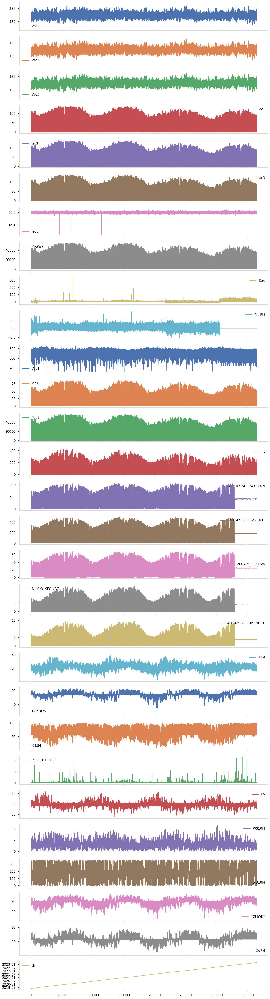

In [ ]:
subset_E.plot(subplots=True, figsize=(15, 60))

In [ ]:
subset_E = subset_E.set_index('ds')
subset_E = subset_E.resample('D').mean()
subset_E = subset_E.fillna(method='ffill')
subset_E = subset_E.reset_index()

In [ ]:
subset_E = subset_E[['Vac1', 'Vac2', 'Vac3', 'Iac1', 'Iac2', 'Iac3', 'Freq', 'Pac(W)', 'Qac',
                     'CosPhi', 'Vdc1', 'Idc1', 'Pdc1', 'ALLSKY_SFC_SW_DWN',
                     'ALLSKY_SFC_PAR_TOT', 'ALLSKY_SFC_UVA', 'ALLSKY_SFC_UVB',
                     'ALLSKY_SFC_UV_INDEX', 'T2M', 'T2MDEW', 'RH2M', 'PRECTOTCORR', 'PS',
                     'WS10M', 'WD10M', 'T2MWET', 'QV2M', 'ds', 'y']]

In [ ]:
subset_E.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1443 entries, 0 to 1442
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Vac1                 1443 non-null   float64       
 1   Vac2                 1443 non-null   float64       
 2   Vac3                 1443 non-null   float64       
 3   Iac1                 1443 non-null   float64       
 4   Iac2                 1443 non-null   float64       
 5   Iac3                 1443 non-null   float64       
 6   Freq                 1443 non-null   float64       
 7   Pac(W)               1443 non-null   float64       
 8   Qac                  1443 non-null   float64       
 9   CosPhi               1443 non-null   float64       
 10  Vdc1                 1443 non-null   float64       
 11  Idc1                 1443 non-null   float64       
 12  Pdc1                 1443 non-null   float64       
 13  ALLSKY_SFC_SW_DWN    1443 non-nul

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
teste = subset_E[['ds', 'y']].copy()
teste = teste.set_index('ds')

In [ ]:
teste

,y
ds,
2019-05-04,105.361277
2019-05-05,129.033617
2019-05-06,120.372766
2019-05-07,113.440217
2019-05-08,143.070000
...,...
2023-04-11,127.325102
2023-04-12,87.204694
2023-04-13,105.778571


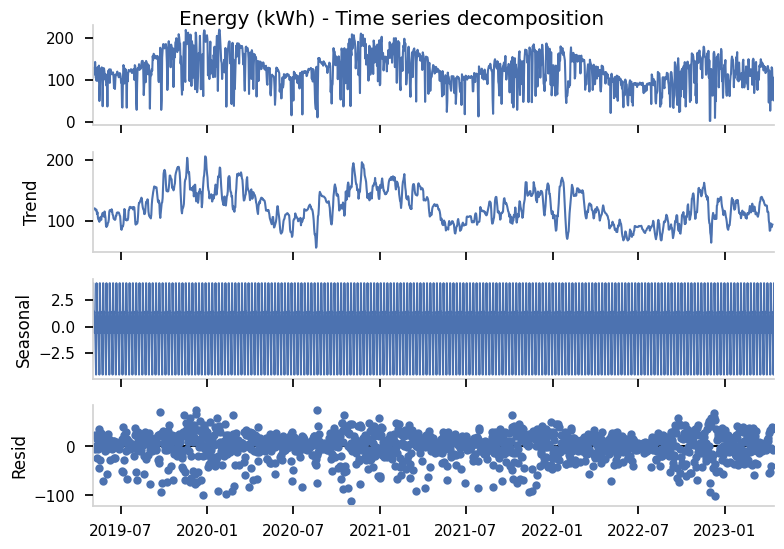

In [ ]:
result = seasonal_decompose(teste, model='additive')
result.plot()
plt.suptitle('Energy (kWh) - Time series decomposition', y=0.995)
plt.savefig('teste.svg', format='svg', dpi=600)

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
energy = teste.copy()

In [ ]:
result = adfuller(energy)
print(f'ADF Statistic: {result[0]}')
print(f'n_lags: {result[1]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -2.8660946315481017
n_lags: 0.049435180513689024
p-value: 0.049435180513689024
Critial Values:
   1%, -3.4349700122033804
Critial Values:
   5%, -2.8635804131233096
Critial Values:
   10%, -2.567856305330816


In [ ]:
from statsmodels.tsa.stattools import kpss


def kpss_test(timeseries):
    print("Results of KPSS Test:")
    kpsstest = kpss(timeseries, regression="c", nlags="auto")
    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value
    print(kpss_output)

In [ ]:
kpss_test(energy)

Results of KPSS Test:
Test Statistic            1.287349
p-value                   0.010000
Lags Used                21.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64


In [ ]:
!pip install -U dataprep

/bin/bash: /home/grnbatera/miniconda3/envs/tf/lib/libtinfo.so.6: no version information available (required by /bin/bash)


In [ ]:
from dataprep.eda import create_report

  0%|                                                  | 0/6469 [00:00<?, ?it/s]

Report has been saved to report_ginásio2.html!


DataPrep Report
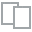
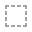
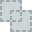
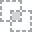
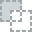
...
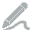
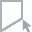
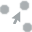
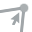
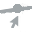

In [ ]:
report2 = create_report(subset_E)
report2.save('report_ginásio2.html')
report2

In [ ]:
colunas = subset_E.columns

In [ ]:
df_train = subset_E[:-430]
train = df_train[:-300]
val = df_train[-300:]
test = subset_E[-430:]

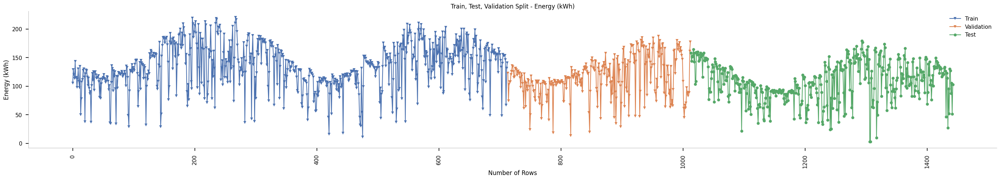

In [ ]:
plt.figure(figsize=(35, 5))
plt.plot(train['y'], marker='v', label='Train')
plt.plot(val['y'], marker='v', label='Validation')
plt.plot(test['y'], marker='o', label='Test')
plt.title('Train, Test, Validation Split - Energy (kWh)')
plt.xlabel('Number of Rows')
plt.ylabel('Energy (kWh)')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('split.svg', format='svg', dpi=600)
plt.show()

In [ ]:
s = setup(data=train,
          test_data=val,
          target='y',
          fold_strategy='timeseries',
          fold=6,
          session_id=seed,
          n_jobs=-1)

,Description,Value
0,Session id,123
1,Target,y
2,Target type,Regression
3,Original data shape,"(1013, 29)"
4,Transformed data shape,"(1013, 31)"
5,Transformed train set shape,"(713, 31)"
6,Transformed test set shape,"(300, 31)"
7,Numeric features,27
8,Date features,1
9,Preprocess,True


In [ ]:
best = s.compare_models(sort='RMSE')
best

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
omp,Orthogonal Matching Pursuit,10.5629,176.7562,12.4880,0.8793,0.1026,0.0796,0.0117
br,Bayesian Ridge,10.5275,200.4253,12.4986,0.8723,0.1051,0.0800,0.0133
en,Elastic Net,10.2964,195.3861,12.6181,0.8746,0.1071,0.0773,0.0133
llar,Lasso Least Angle Regression,10.4637,207.6032,12.8934,0.8681,0.1126,0.0788,0.0133
lasso,Lasso Regression,10.4695,207.9185,12.8998,0.8679,0.1127,0.0789,0.1750
ridge,Ridge Regression,10.6871,234.2338,12.9147,0.8486,0.1056,0.0809,0.1633
huber,Huber Regressor,11.5964,239.0781,13.8542,0.8464,0.1232,0.0877,0.0150
lr,Linear Regression,12.1135,375.0537,14.6920,0.7629,0.1220,0.0921,0.2317
lightgbm,Light Gradient Boosting Machine,12.1274,367.1515,15.3851,0.7699,0.1464,0.1014,0.0233
rf,Random Forest Regressor,12.7844,477.8208,16.0772,0.7064,0.1367,0.0963,0.0233


Processing:   0%|          | 0/77 [00:00<?, ?it/s]

OrthogonalMatchingPursuit()

In [ ]:
tunado = tune_model(best)
test2 = predict_model(tunado, data=test)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,18.0563,446.5873,21.1326,0.7388,0.1348,0.1135
1,11.8601,187.4873,13.6926,0.8988,0.1177,0.0885
2,9.4536,116.3884,10.7883,0.8985,0.0896,0.0798
3,4.4589,34.6780,5.8888,0.9648,0.0990,0.0593
4,10.3246,154.4487,12.4277,0.8985,0.0956,0.0722
5,9.2239,120.9473,10.9976,0.8763,0.0790,0.0644
Mean,10.5629,176.7562,12.4880,0.8793,0.1026,0.0796
Std,4.0450,129.3360,4.5615,0.0685,0.0185,0.0179


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 6 folds for each of 10 candidates, totalling 60 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Orthogonal Matching Pursuit,6.3177,73.3024,8.5617,0.9355,0.1948,0.1271


In [ ]:
test = predict_model(best, data=test)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Orthogonal Matching Pursuit,6.3177,73.3024,8.5617,0.9355,0.1948,0.1271


In [ ]:
test

,Vac1,Vac2,Vac3,Iac1,Iac2,Iac3,Freq,Pac(W),Qac,CosPhi,...,RH2M,PRECTOTCORR,PS,WS10M,WD10M,T2MWET,QV2M,ds,y,prediction_label
1013,133.197403,133.175552,133.443512,52.968147,52.700554,53.274445,59.992222,21156.121094,1.328889,0.017593,...,62.825478,0.095752,92.869972,3.474411,177.392120,19.893076,12.331076,2022-02-10,158.162964,147.992223
1014,132.307449,132.284729,132.540909,48.328182,48.034184,48.598000,59.996544,19170.841797,1.410727,-0.000909,...,63.090157,0.115581,92.880997,3.283766,175.402451,20.080458,12.493031,2022-02-11,144.130722,133.347182
1015,133.161301,133.352219,133.472412,52.450371,52.156666,52.709076,59.997593,20964.455078,1.883148,0.012407,...,62.975014,0.091394,92.868073,3.292098,178.541672,20.129925,12.532451,2022-02-12,151.187225,150.417042
1016,133.417404,133.595184,133.672592,52.945370,52.657223,53.225368,59.990925,21226.156250,-0.059074,-0.033148,...,62.581638,0.090411,92.826347,3.170528,197.258957,20.315853,12.666679,2022-02-13,153.522781,149.233729
1017,132.612732,132.589279,132.796722,58.147999,57.888546,58.483273,59.998363,23134.005859,0.179273,-0.022000,...,60.571266,0.086332,92.838722,3.064510,195.780029,20.388275,12.456317,2022-02-14,164.778732,163.296895
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1438,132.349792,132.261627,132.702042,51.299797,51.431427,51.694286,59.997143,20434.341797,21.283470,0.000000,...,64.439438,0.134938,92.963371,3.233437,201.646881,19.727947,12.375210,2023-04-11,127.325104,141.056647
1439,132.717758,132.570618,133.054489,35.123470,35.226532,35.421631,59.997349,14031.304688,14.853878,0.000000,...,65.249962,0.180197,92.904427,3.429352,223.087067,19.984678,12.647036,2023-04-12,87.204697,93.931648
1440,132.131424,131.961838,132.480408,40.642448,40.751225,40.977959,60.003059,16083.915039,17.214285,0.000000,...,65.687325,0.146671,92.865746,3.332579,222.407196,20.074268,12.765455,2023-04-13,105.778572,112.805523
1441,132.750610,132.586121,133.114899,20.992041,21.058367,21.193266,59.998165,8290.092773,8.807755,0.000000,...,66.248421,0.188183,92.857132,3.051668,213.347992,20.093645,12.737344,2023-04-14,51.688774,64.190183


In [ ]:
test.to_csv('cpten_pycaret.csv')

In [ ]:
test = test.set_index('ds')

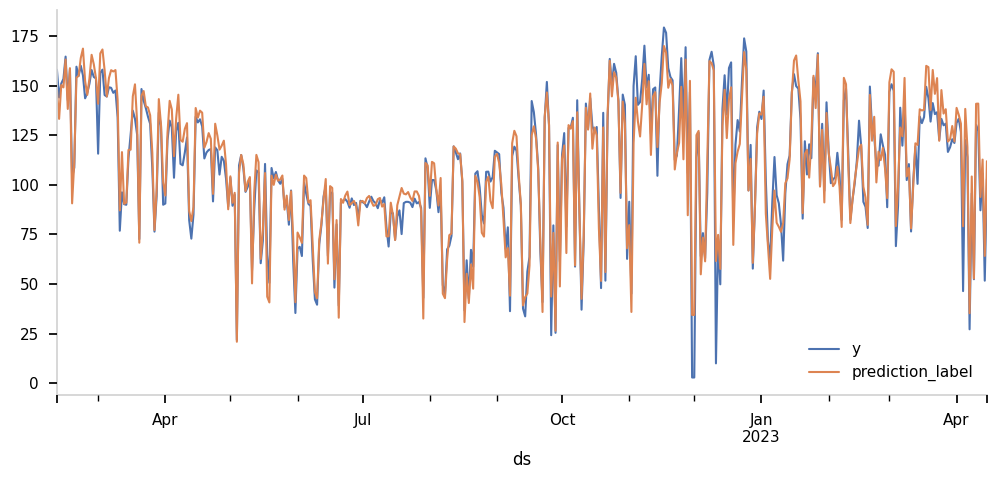

In [ ]:
test[['y','prediction_label']].plot(figsize=(12,5))
plt.savefig('02.png', format='png', dpi=600)

In [ ]:
mean_squared_error(test['y'], test['prediction_label'])

73.30235085175457

In [ ]:
mean_squared_error(test['y'], test['prediction_label'], squared=False)

8.561679207477617

In [ ]:
mean_absolute_percentage_error(test['y'], test['prediction_label'])

0.12713152463924932

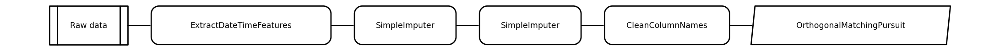

In [ ]:
evaluate_model(best)

In [ ]:
! python --version

/bin/bash: /home/grnbatera/miniconda3/envs/tf/lib/libtinfo.so.6: no version information available (required by /bin/bash)
Python 3.8.20
